In [1]:
import json
import typing

import arviz
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from utils.model_builder import ModelBuilder
from utils.posteriorplots import predictive_plot, retrodictive_plot

In [2]:
arviz.style.use("arviz-darkgrid")
arviz.rcParams["plot.max_subplots"] = 50

In [3]:
%load_ext autoreload
%autoreload 2

## Model with socio-eco predictors

In [28]:
election_date = "2022-04-10"
mb = ModelBuilder(
    election_to_predict=election_date,
    test_cutoff=None,
    variance_weight=[0.1, 0.4, 0.5],
    lengthscale=[5, 14, 28],
)

/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.9/site-packages/pandas/core/algorithms.py:431: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior.  In a future version these will be considered non-comparable.Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  uniques = table.unique(values)
/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.9/site-packages/pandas/core/indexes/base.py:2023: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior.  In a future version these will be considered non-comparable.Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  return self._engine.is_unique
/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.9/site-packages/pandas/core/indexes/base.py:3512: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the 

In [29]:
mb.polls_train

,date,sondage,dateelection,countdown,samplesize,farleft,left,green,center,right,farright,other,unemployment
0,2002-01-02,BVA,2002-04-21,109,919,64,221,64,46,193,92,239,7.5
1,2002-01-03,CSA,2002-04-21,108,997,50,214,60,40,279,100,254,7.5
2,2002-01-04,Ipsos,2002-04-21,107,5297,318,1218,265,212,1483,477,1324,7.5
3,2002-01-05,BVA,2002-04-21,106,500,35,120,35,15,135,45,115,7.5
4,2002-01-05,Kantar,2002-04-21,106,763,53,183,46,23,206,69,183,7.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
441,2022-01-08,Ifop,2022-04-10,92,1042,89,36,57,271,167,177,245,7.9
442,2022-01-08,OpinionWay,2022-04-10,92,1397,126,56,112,349,224,237,293,7.9
443,2022-01-10,Elabe,2022-04-10,90,952,95,24,57,214,152,157,253,7.9
444,2022-01-10,Ifop,2022-04-10,90,1035,93,36,57,264,166,171,248,7.9


In [13]:
polls = pd.read_csv(
    "https://raw.githubusercontent.com/pollsposition/data/main/sondages"
    "/tour1_complet_unitedfl.csv",
    index_col=0,
    parse_dates=["dateelection", "date"],
)

# only president elections after 2002
polls = polls[(polls.date >= "2002-01") & (polls.type == "president")].drop(
    [
        "type",
        "abstention",
        "undecided",
    ],
    axis=1,
)

# no green party candidate in 2017
polls.loc[polls["dateelection"] == "2017-04-23", "nbgreen"] = 0

polls = polls.sort_values(["dateelection", "date", "sondage", "samplesize"]).reset_index(
    drop=True
)

In [14]:
polls

,dateelection,date,sondage,samplesize,nbfarleft,nbleft,nbgreen,nbcenterleft,nbcenter,nbcenterright,nbright,nbsouverainistes,nbcpnt,nbfarright,nbother
0,2002-04-21,2002-01-02,BVA,920.0,7.00,24.00,7.0,NaN,5.00,NaN,21.00,NaN,NaN,10.0,NaN
1,2002-04-21,2002-01-03,CSA,995.0,5.00,21.50,6.0,NaN,4.00,NaN,28.00,NaN,NaN,10.0,NaN
2,2002-04-21,2002-01-04,Ipsos,5297.0,6.00,23.00,5.0,NaN,4.00,NaN,28.00,NaN,NaN,9.0,NaN
3,2002-04-21,2002-01-05,BVA,500.0,7.00,24.00,7.0,NaN,3.00,NaN,27.00,NaN,NaN,9.0,NaN
4,2002-04-21,2002-01-05,Kantar,763.0,7.00,24.00,6.0,NaN,3.00,NaN,27.00,NaN,NaN,9.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
483,2017-04-23,2017-04-20,Ifop,1900.0,18.50,7.00,0.0,NaN,24.50,NaN,19.50,4.0,NaN,22.5,2.00
484,2017-04-23,2017-04-20,Ipsos,1401.0,19.00,7.50,0.0,NaN,24.00,NaN,19.00,4.0,NaN,22.0,2.50
485,2017-04-23,2017-04-21,BVA,1134.0,19.50,8.00,0.0,NaN,23.00,NaN,19.00,4.0,NaN,23.0,1.50
486,2017-04-23,2017-04-21,Odoxa,666.0,19.00,7.50,0.0,NaN,24.50,NaN,19.00,4.5,NaN,23.0,1.50


In [20]:
with open("../../../data/sondages/presidentielles_2022.json") as f:
    raw_polls = json.load(f)

In [21]:
def select_hypothesis(poll: typing.List) -> pd.DataFrame:
    """
    Select hypothesis with Taubira when present.
    Just return poll otherwise.
    """
    for hypothesis in poll:
        intentions = hypothesis["intentions"]
        if "Christiane Taubira" in intentions.keys():
            # this return assumes there is only one Taubira hypothesis
            return pd.json_normalize(hypothesis)
    return pd.json_normalize(hypothesis)

In [22]:
metadata = []
for poll in raw_polls["sondages"].keys():
    metadata.append(
        pd.json_normalize(raw_polls["sondages"][poll])[
            ["institut", "date_debut", "date_fin", "premier_tour"]
        ]
    )

metadata = pd.concat(metadata).sort_values("date_debut")
metadata[["date_debut", "date_fin"]] = metadata[["date_debut", "date_fin"]].apply(
    pd.to_datetime
)
metadata = metadata[metadata.date_debut >= "2022-01-01"].reset_index(drop=True)

polls_temp = []
for _, row in metadata.iterrows():
    poll = row["premier_tour"]
    polls_temp.append(select_hypothesis(poll))
polls_temp = pd.concat(polls_temp).reset_index(drop=True)

In [23]:
# exclude certitude
new_polls = pd.concat([metadata, polls_temp], axis=1).drop(
    ["premier_tour", "base", "nspp", "hypothese"], axis=1
)
exclude = new_polls.filter(regex="certitude.").columns
new_polls = new_polls.drop(exclude, axis=1)

In [24]:
# different renames
to_rename = new_polls.filter(regex="intentions\.").columns
new_names = (
    new_polls.filter(regex="intentions\.")
    .columns.str.split(".", expand=True)
    .droplevel(0)
)
AFFILIATIONS = {
    "Jean-Luc Mélenchon": "nbfarleft",
    "Anne Hidalgo": "nbleft",
    "Yannick Jadot": "nbgreen",
    "Emmanuel Macron": "nbcenter",
    "Valérie Pécresse": "nbright",
    "Marine Le Pen": "nbfarright",
    "Éric Zemmour": "nbzemmour",
}

new_polls = new_polls.rename(
    columns={"institut": "sondage", "intentions_exprimees": "samplesize"}
    | {old: new for old, new in zip(to_rename, new_names)}
).rename(columns=AFFILIATIONS).replace({"Harris interactive": "Harris", "Opinionway": "OpinionWay"})

In [25]:
# compute median date
new_polls["date"] = pd.to_datetime(np.median(new_polls[["date_debut", "date_fin"]].values.astype(np.int64), axis=1))
new_polls["date"] = new_polls["date"].dt.date
new_polls["dateelection"] = pd.to_datetime("2022-04-10")
new_polls = new_polls.drop(["date_debut", "date_fin"], axis=1)

In [26]:
# aggregate other parties:
core_cols = ["sondage", "date", "dateelection", "samplesize"] + list(AFFILIATIONS.values())
rest = new_polls[new_polls.columns.difference(core_cols)]
new_polls["nbother"] = rest.sum(axis=1)
new_polls = new_polls.drop(rest.columns, axis=1)

In [27]:
polls = pd.concat([polls, new_polls], axis=0).sort_values(["dateelection", "date", "sondage", "samplesize"]).reset_index(
    drop=True
)
polls["nbzemmour"] = polls["nbzemmour"].fillna(0)
polls

,dateelection,date,sondage,samplesize,nbfarleft,nbleft,nbgreen,nbcenterleft,nbcenter,nbcenterright,nbright,nbsouverainistes,nbcpnt,nbfarright,nbother,nbzemmour
0,2002-04-21,2002-01-02 00:00:00,BVA,920.0,7.0,24.0,7.0,NaN,5.0,NaN,21.0,NaN,NaN,10.0,NaN,0.0
1,2002-04-21,2002-01-03 00:00:00,CSA,995.0,5.0,21.5,6.0,NaN,4.0,NaN,28.0,NaN,NaN,10.0,NaN,0.0
2,2002-04-21,2002-01-04 00:00:00,Ipsos,5297.0,6.0,23.0,5.0,NaN,4.0,NaN,28.0,NaN,NaN,9.0,NaN,0.0
3,2002-04-21,2002-01-05 00:00:00,BVA,500.0,7.0,24.0,7.0,NaN,3.0,NaN,27.0,NaN,NaN,9.0,NaN,0.0
4,2002-04-21,2002-01-05 00:00:00,Kantar,763.0,7.0,24.0,6.0,NaN,3.0,NaN,27.0,NaN,NaN,9.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
493,2022-04-10,2022-01-08,Ifop,1042.0,8.5,3.5,5.5,NaN,26.0,NaN,16.0,NaN,NaN,17.0,11.0,12.5
494,2022-04-10,2022-01-08,OpinionWay,1397.0,9.0,4.0,8.0,NaN,25.0,NaN,16.0,NaN,NaN,17.0,9.0,12.0
495,2022-04-10,2022-01-10,Elabe,953.0,10.0,2.5,6.0,NaN,22.5,NaN,16.0,NaN,NaN,16.5,13.5,13.0
496,2022-04-10,2022-01-10,Ifop,1035.0,9.0,3.5,5.5,NaN,25.5,NaN,16.0,NaN,NaN,16.5,10.0,14.0


In [30]:
pd.read_csv(
    "https://raw.githubusercontent.com/pollsposition/data/main/predicteurs/chomage_national_trim.csv",
    sep=";",
    skiprows=2,
).iloc[:, [0, 1]]

,Période,Unnamed: 1
0,2021-T3,7.9
1,2021-T2,7.8
2,2021-T1,7.8
3,2020-T4,7.8
4,2020-T3,8.9
...,...,...
182,1976-T1,3.9
183,1975-T4,3.8
184,1975-T3,3.6
185,1975-T2,3.4


TEST_CUTOFF = Timedelta('56 days 00:00:00')



Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration, election_party_time_coefs, party_time_coefs_raw, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_election_party_amplitude, lsd_party_effect_party_amplitude, lsd_intercept, unemployment_effect, house_election_effects_raw, house_election_effects_sd, house_effects, poll_bias, election_party_intercept, election_party_intercept_sd, party_intercept, party_intercept_sd]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 745 seconds.


TEST_CUTOFF = Timedelta('42 days 00:00:00')



/Users/alex_andorra/repos/pollsposition/models/presidential-elections/utils/model_builder.py:134: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["countdown"] = dates_to_idx(df["date"], reference_date=date).astype(int)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration, election_party_time_coefs, party_time_coefs_raw, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_election_party_amplitude, lsd_party_effect_party_amplitude, lsd_intercept, unemployment_effect, house_election_effects_raw, house_election_effects_sd, house_effects, poll_bias, election_party_intercept, election_party_intercept_sd, party_intercept, party_interc

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 867 seconds.
The number of effective samples is smaller than 25% for some parameters.


TEST_CUTOFF = Timedelta('28 days 00:00:00')



/Users/alex_andorra/repos/pollsposition/models/presidential-elections/utils/model_builder.py:134: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["countdown"] = dates_to_idx(df["date"], reference_date=date).astype(int)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration, election_party_time_coefs, party_time_coefs_raw, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_election_party_amplitude, lsd_party_effect_party_amplitude, lsd_intercept, unemployment_effect, house_election_effects_raw, house_election_effects_sd, house_effects, poll_bias, election_party_intercept, election_party_intercept_sd, party_intercept, party_interc

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 877 seconds.
The number of effective samples is smaller than 25% for some parameters.


TEST_CUTOFF = Timedelta('14 days 00:00:00')



/Users/alex_andorra/repos/pollsposition/models/presidential-elections/utils/model_builder.py:134: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["countdown"] = dates_to_idx(df["date"], reference_date=date).astype(int)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration, election_party_time_coefs, party_time_coefs_raw, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_election_party_amplitude, lsd_party_effect_party_amplitude, lsd_intercept, unemployment_effect, house_election_effects_raw, house_election_effects_sd, house_effects, poll_bias, election_party_intercept, election_party_intercept_sd, party_intercept, party_interc

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 780 seconds.


TEST_CUTOFF = None



/Users/alex_andorra/repos/pollsposition/models/presidential-elections/utils/model_builder.py:134: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["countdown"] = dates_to_idx(df["date"], reference_date=date).astype(int)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration, election_party_time_coefs, party_time_coefs_raw, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_election_party_amplitude, lsd_party_effect_party_amplitude, lsd_intercept, unemployment_effect, house_election_effects_raw, house_election_effects_sd, house_effects, poll_bias, election_party_intercept, election_party_intercept_sd, party_intercept, party_interc

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 814 seconds.


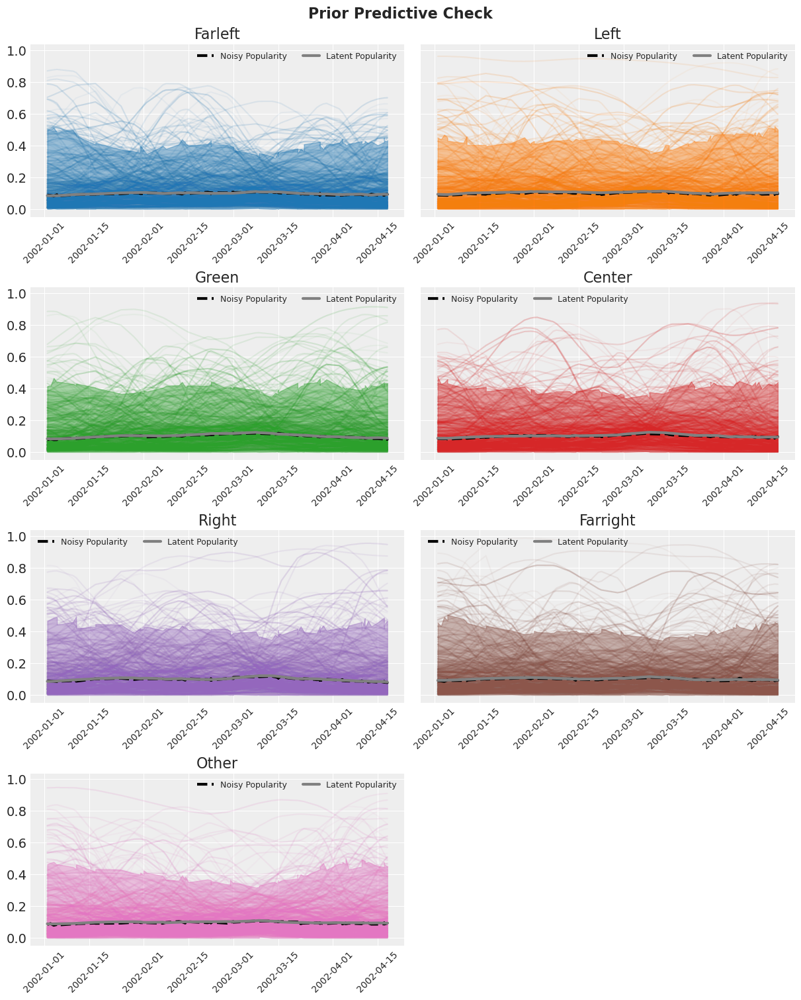

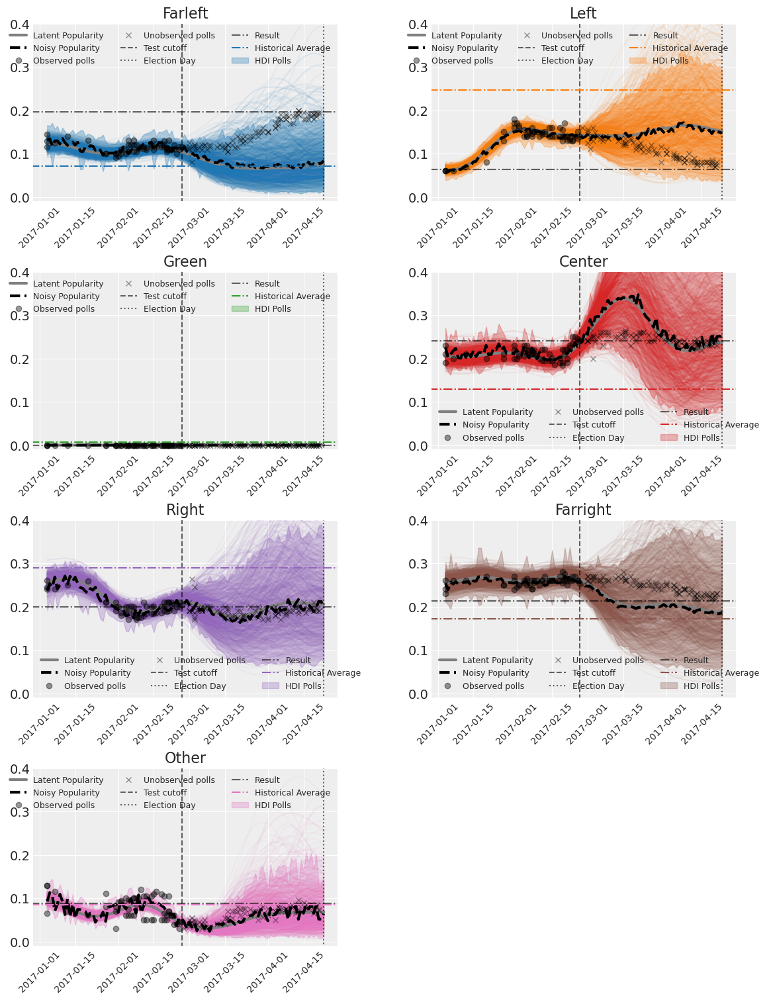

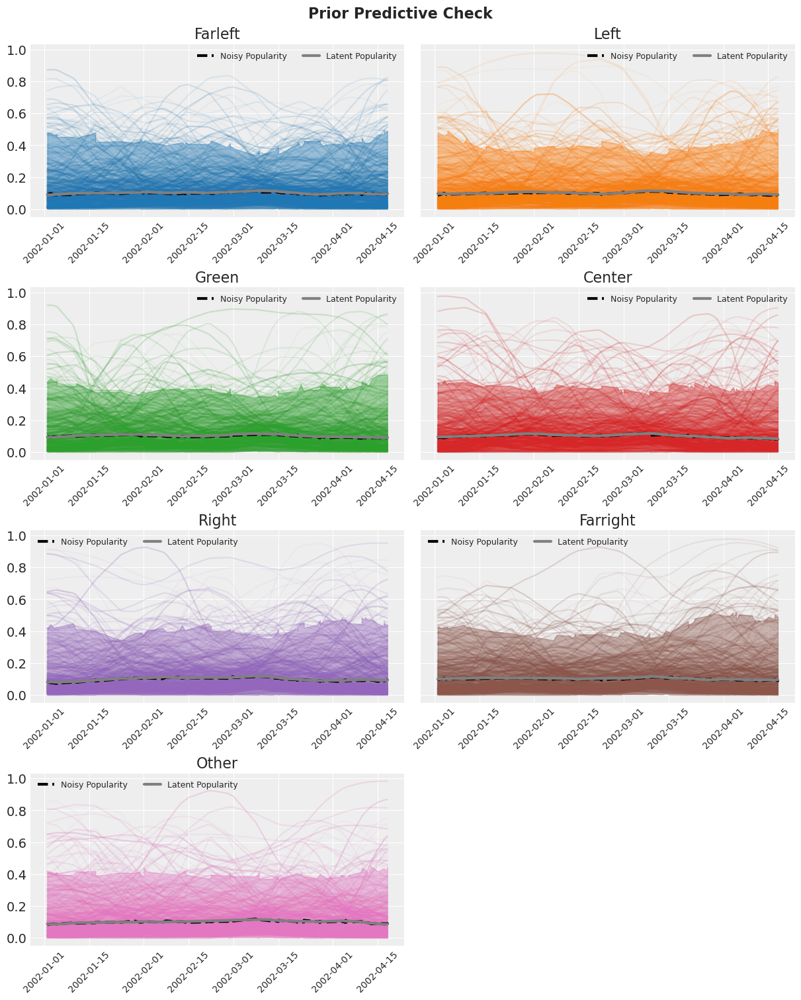

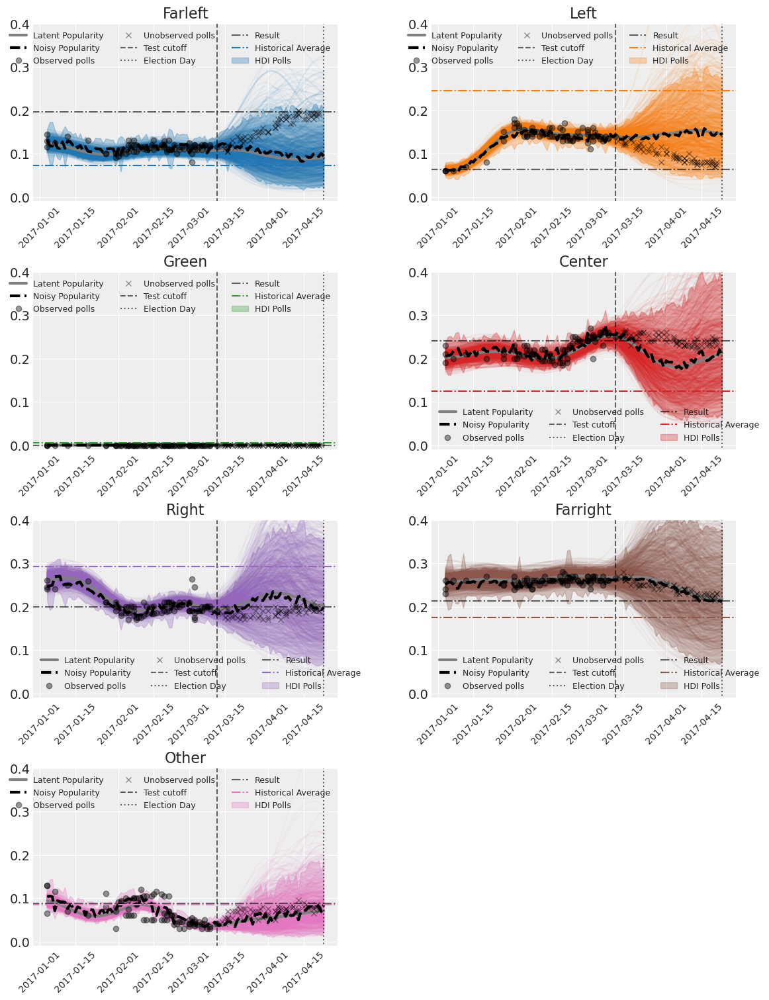

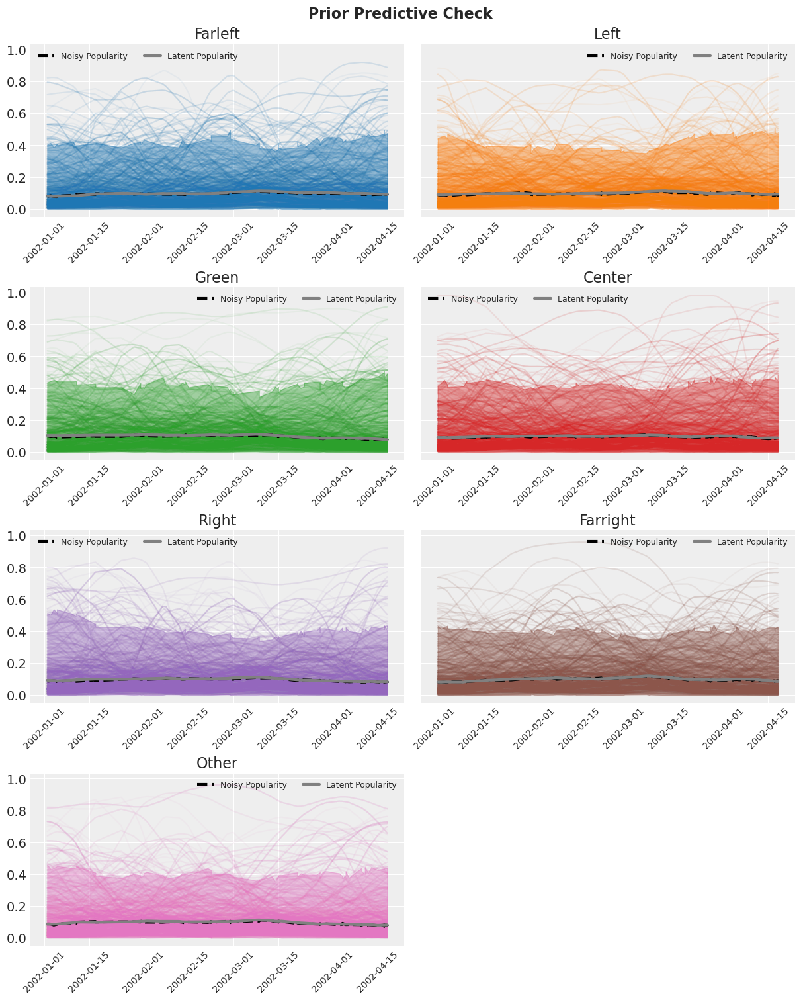

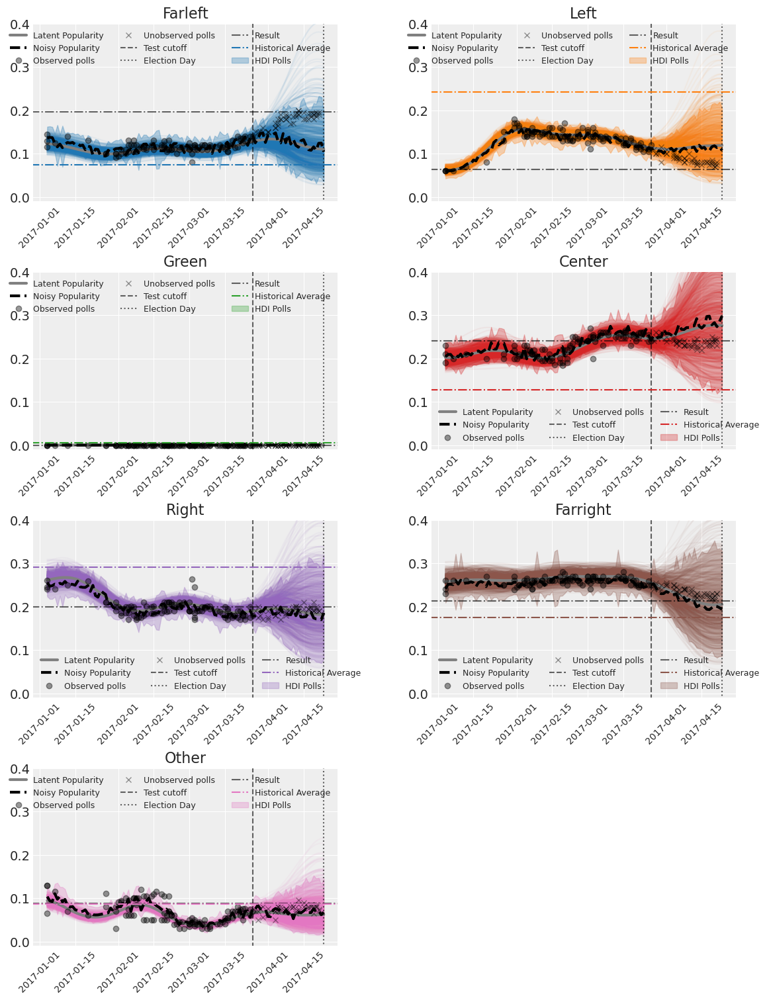

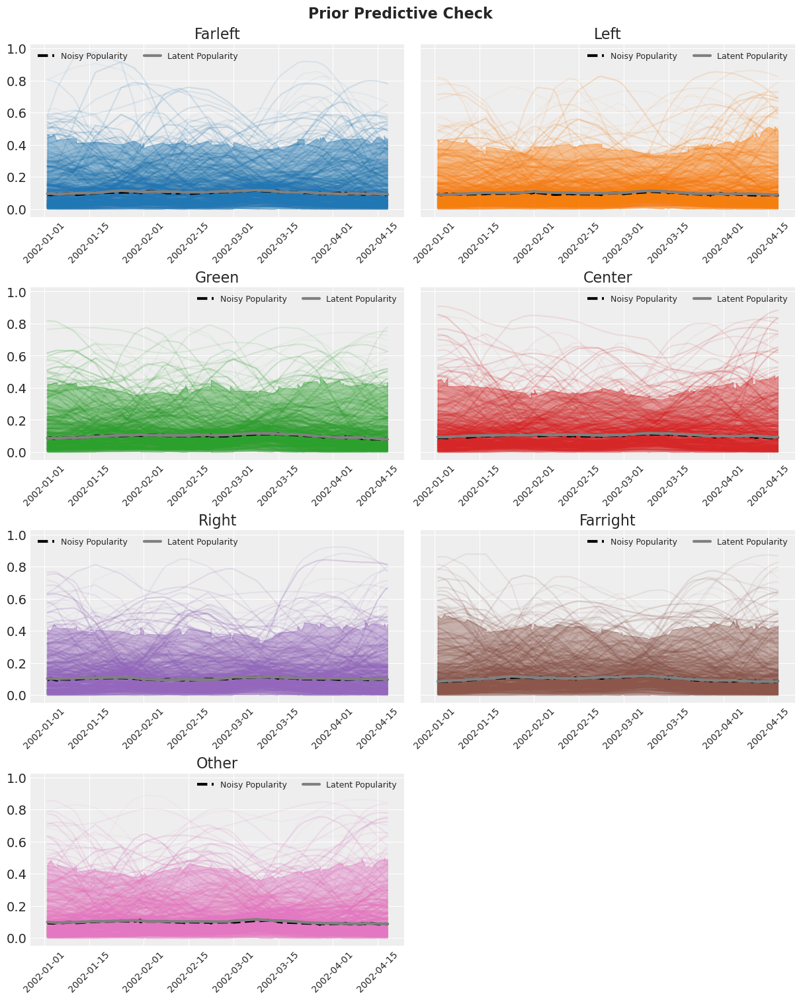

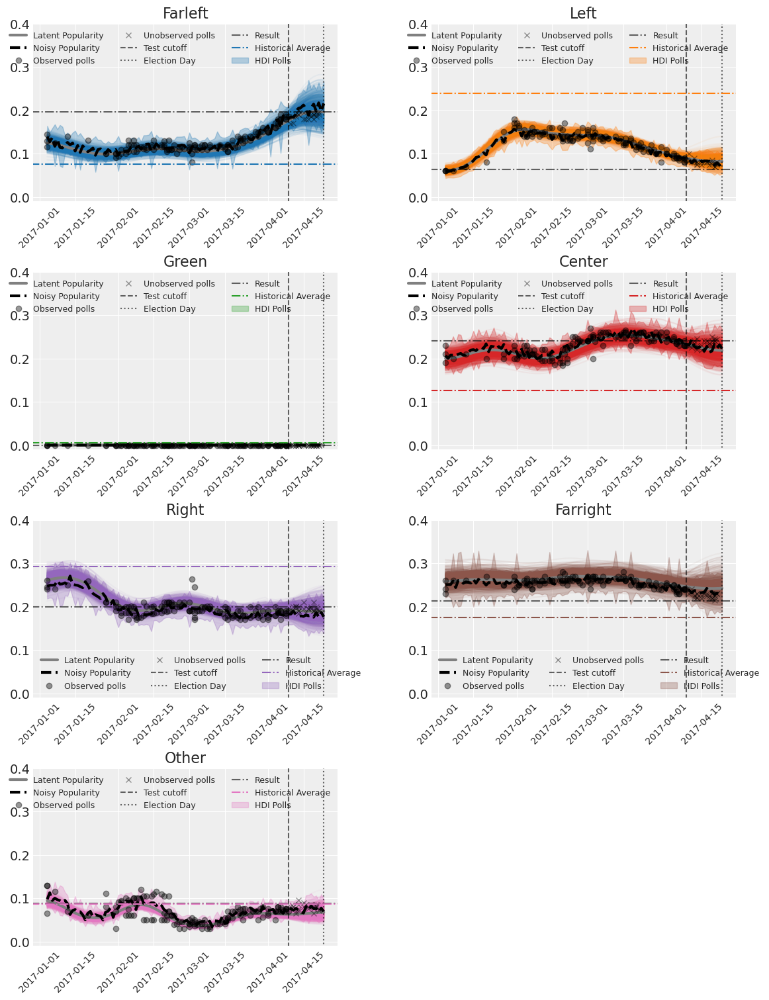

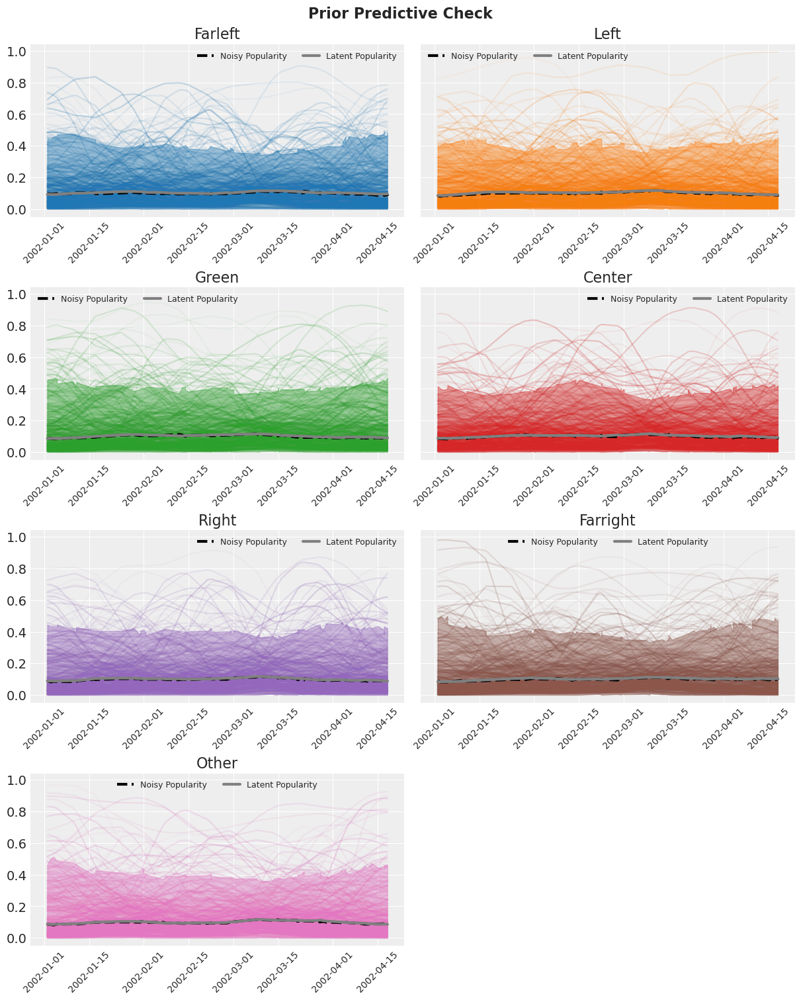

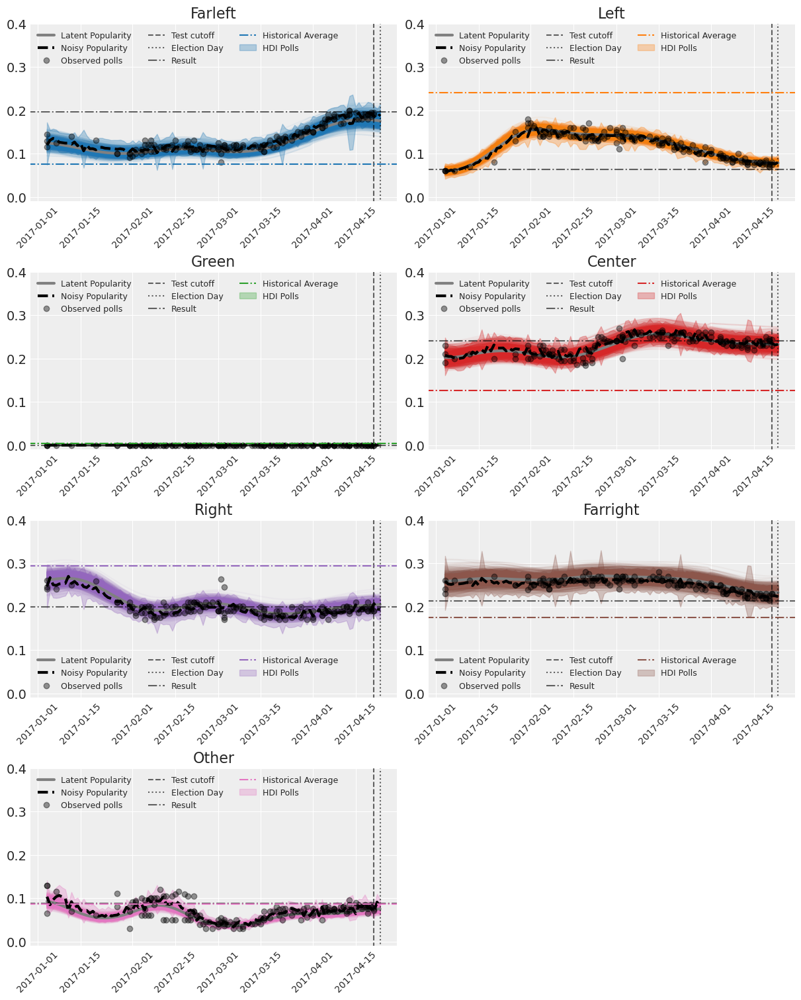

In [11]:
for i in [8, 6, 4, 2, None]:
    if i:
        TEST_CUTOFF = pd.Timedelta(i, "W")
    else:
        TEST_CUTOFF = None
    print(f"{TEST_CUTOFF = }\n")

    election_date = "2017-04-23"
    mb = ModelBuilder(
        election_to_predict=election_date,
        test_cutoff=TEST_CUTOFF,
        variance_weight=[0.1, 0.4, 0.5],  # [0.1, 0.3, 0.6], [0.2, 0.5, 0.3],
        lengthscale=[5, 14, 28],
    )
    hierarchical_dm = mb.build_model()

    idata_hierarchical_dm = mb.sample_all(
        var_names=[
            "latent_popularity",
            "latent_pop_t0",
            "R",
            "noisy_popularity",
            "N_approve",
        ],
    )

    polls_train = mb.polls_train.copy()
    retrodictive_plot(
        idata_hierarchical_dm.sel(
            elections="2002-04-21",
            observations=polls_train[polls_train.dateelection == "2002-04-21"].index,
        ),
        mb.parties_complete,
        polls_train[polls_train.dateelection == "2002-04-21"],
        group="prior",
    )

    election_forecast = mb.forecast_election(idata_hierarchical_dm)

    results = mb.results_raw.copy()
    polls_test = mb.polls_test.copy()
    predictive_plot(
        election_forecast,
        mb.parties_complete,
        election_date,
        results[results.dateelection == election_date],
        polls_train[polls_train.dateelection == election_date],
        polls_test[polls_test.dateelection == election_date],
        TEST_CUTOFF,
    )
    if i:
        plt.savefig(f"ppc_{i}_weeks.png")
    else:
        plt.savefig("ppc_2_days.png")

In [12]:
summary = arviz.summary(idata_hierarchical_dm, round_to=2)
low_ess = summary[(summary.ess_bulk <= 1000) | (summary.ess_tail <= 1000)]

In [13]:
summary[(summary.ess_bulk <= 400) | (summary.ess_tail <= 400)]

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat


In [14]:
low_ess[
    (~low_ess.index.str.startswith("noisy"))
    & (~low_ess.index.str.startswith("latent"))
    & (~low_ess.index.str.startswith("election_party_time_effect"))
]

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat


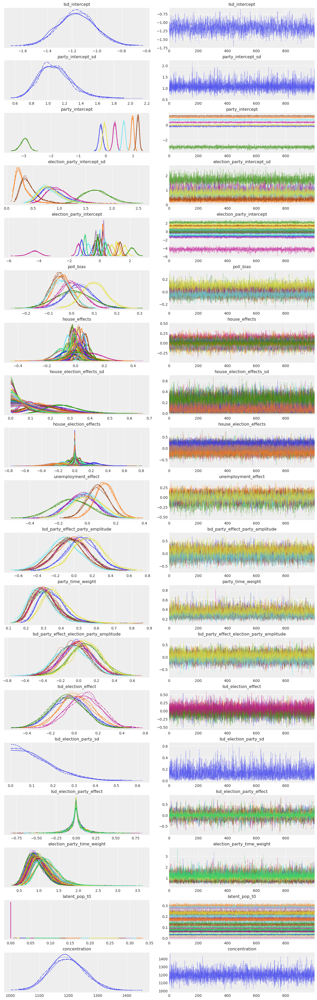

In [15]:
arviz.plot_trace(
    idata_hierarchical_dm,
    var_names=[
        "~time_effect",
        "~time_coefs",
        "~latent_popularity",
        "~noisy_popularity",
        "~raw",
    ],
    filter_vars="regex",
);

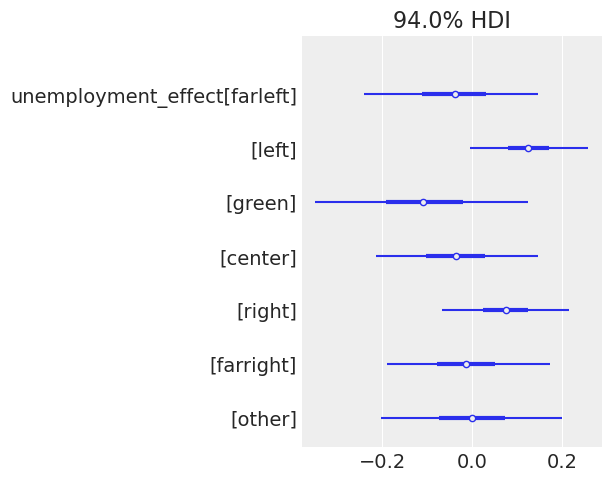

In [16]:
arviz.plot_forest(election_forecast, var_names="unemployment_effect", combined=True);

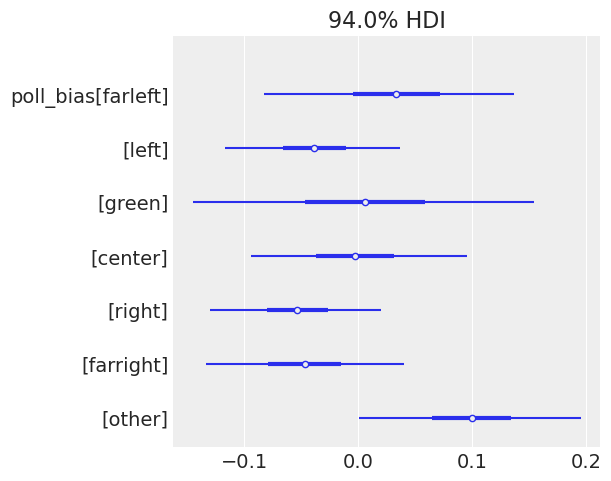

In [17]:
arviz.plot_forest(election_forecast, var_names="poll_bias", combined=True);

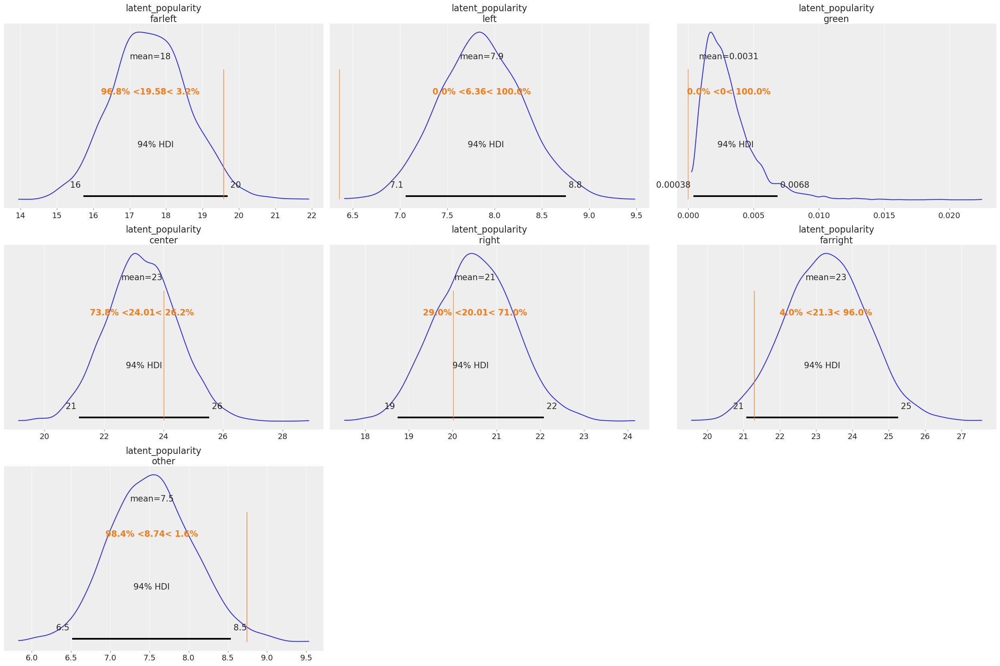

In [18]:
arviz.plot_posterior(
    election_forecast.predictions["latent_popularity"].sel(observations="2017-04-23")
    * 100,
    ref_val=results[mb.parties_complete].iloc[-1].to_list(),
);

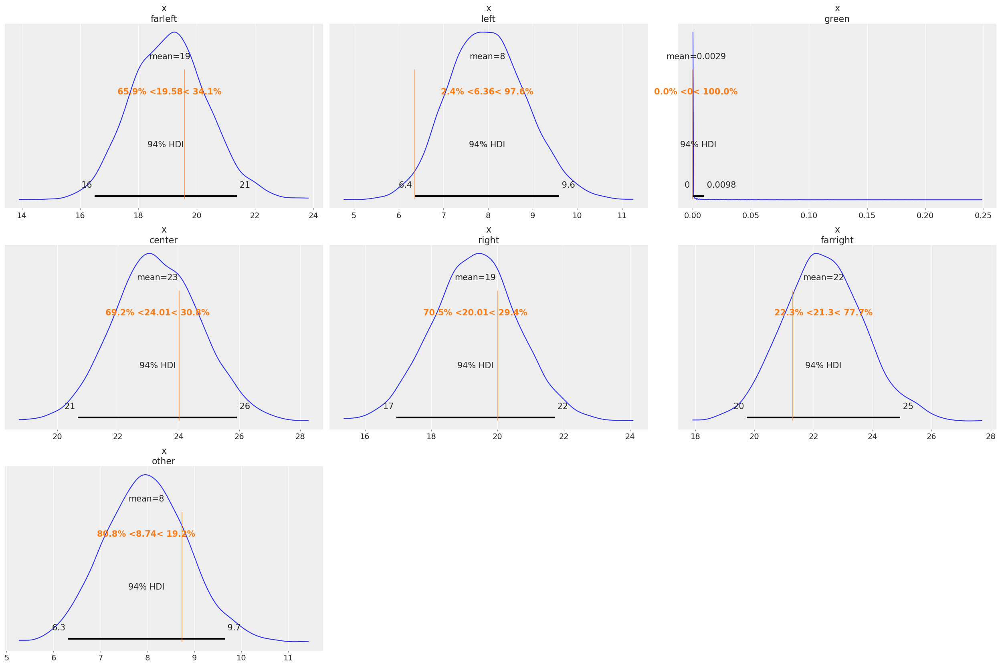

In [19]:
arviz.plot_posterior(
    (
        election_forecast.predictions["N_approve"]
        / election_forecast.predictions_constant_data["observed_N"]
    ).sel(observations="2017-04-23")
    * 100,
    ref_val=results[mb.parties_complete].iloc[-1].to_list(),
);

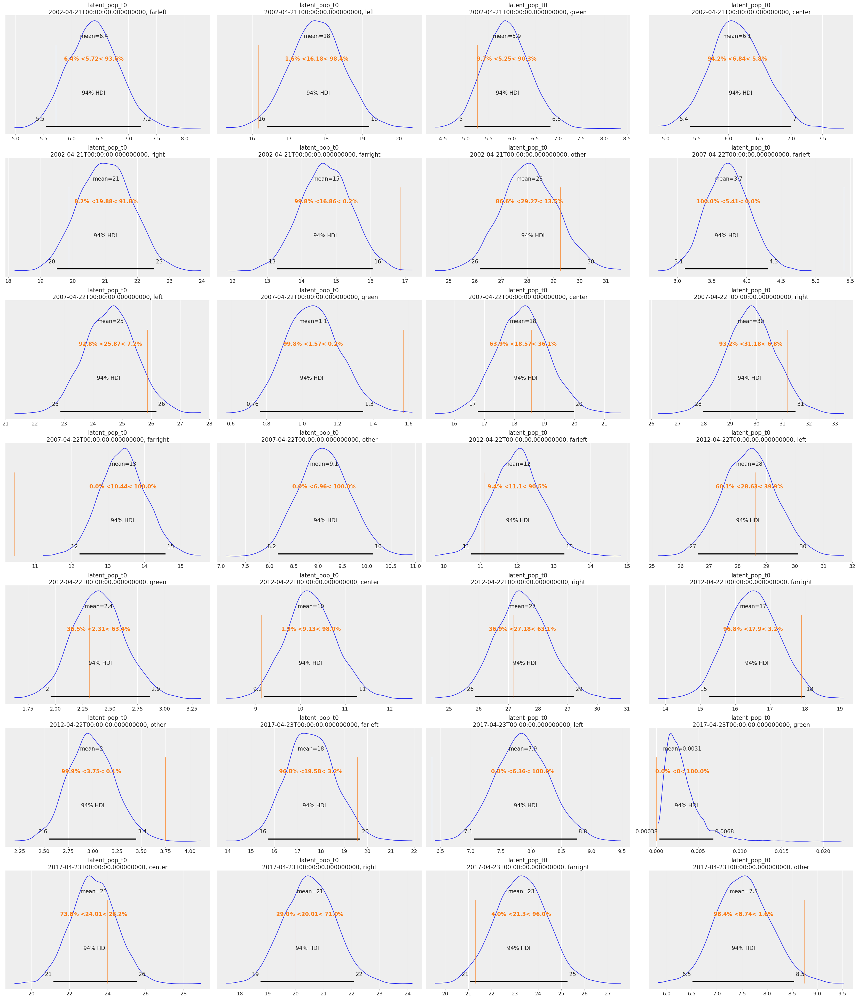

In [20]:
arviz.plot_posterior(
    election_forecast.predictions["latent_pop_t0"] * 100,
    ref_val=results[mb.parties_complete].to_numpy().flatten().tolist(),
);

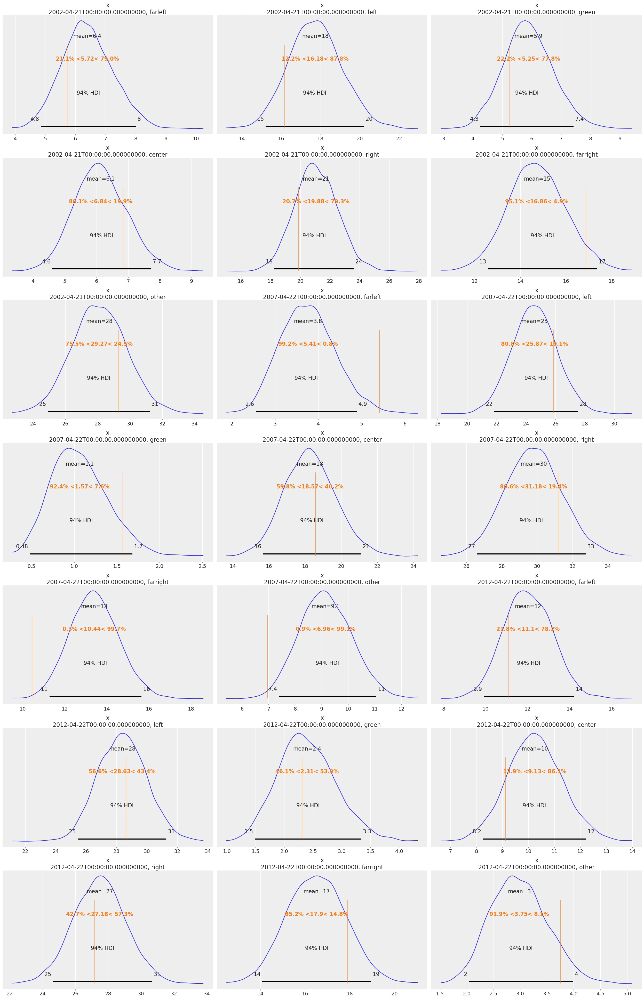

In [21]:
arviz.plot_posterior(
    (
        election_forecast.predictions["R"]
        / election_forecast.predictions_constant_data["results_N"]
    )
    * 100,
    ref_val=results[mb.parties_complete].to_numpy().flatten().tolist(),
);

In [26]:
# force green at 0
# covarying GP (transition matrix)

In [ ]:
# https://www.itl.nist.gov/div898/handbook/eda/section3/qqplot.htm
# add other election types (https://github.com/pollsposition/models/blob/master/district-level/munic_model_prod.ipynb)